# Lab N
### Morphology

Skimage morphology operators' documentation:
https://scikit-image.org/docs/dev/api/skimage.morphology.html

In [1]:
from commonfunctions import *
from func import *
import imutils
import os
import matplotlib.image as mpimg
import numpy as np
import cv2 
import skimage.io as io
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.morphology import binary_erosion, binary_dilation,black_tophat, binary_closing,skeletonize, thin,area_closing,area_opening
from skimage.measure import find_contours
from skimage.morphology import (square, rectangle, diamond, disk, cube,
                                octahedron, ball, octagon, star)
from skimage.draw import rectangle
from skimage import img_as_ubyte
from skimage.filters import threshold_otsu
# Show the figures / plots inside the notebook
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
'''
2) Case Study: Credit Card Number Extraction
    - Load "card.jpg" from the img folder
    - Convert the image to binary by brightness thresholding maintaining the card number details for extraction
    - Use your erosion/dilation functions, or Skimage's functions only if you didn't implement them, to apply closing
        Note: The goal of this step is to join the card number into 4 sets of connected pixels
    - Use Skimage's "find_contours" to get the bounding boxes for the credit card's numbers by filtering on aspect ratio (between 2.5 & 3.5)
        Note: When using "find_contours(img, 0.8)" the o/p is a list of contours each having:
                - contour[:,0] being the Y values of the contour perimeter points
                - contour[:,1] being the X values of the contour perimeter points
'''

#When provided with the correct format of the list of bounding_boxes, this section will set all pixels inside boxes in img_with_boxes
for box in bounding_boxes:
    [Xmin, Xmax, Ymin, Ymax] = box
    rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=img_gray.shape)
    img_with_boxes[rr, cc] = 1 #set color white

NameError: name 'bounding_boxes' is not defined

In [3]:
'''
3) Skeletonization:
    - Load "horse.jpg" from the img folder 
    - Use a binary threshold of 0.9 to remove invisible noise in the background
    - Use Skimage's "skeletonize(image)" to acquire the image's skeleton & show it
    - Use Skimage's "thin(image, max_iter)" with values of max_iter 5/10/15/20 & show it
'''




'\n3) Skeletonization:\n    - Load "horse.jpg" from the img folder \n    - Use a binary threshold of 0.9 to remove invisible noise in the background\n    - Use Skimage\'s "skeletonize(image)" to acquire the image\'s skeleton & show it\n    - Use Skimage\'s "thin(image, max_iter)" with values of max_iter 5/10/15/20 & show it\n'

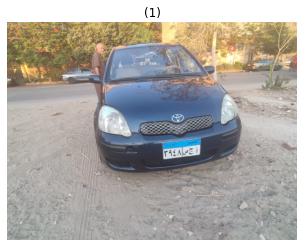

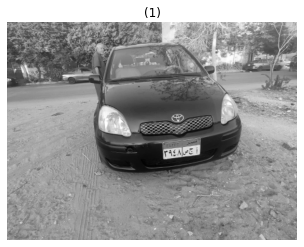

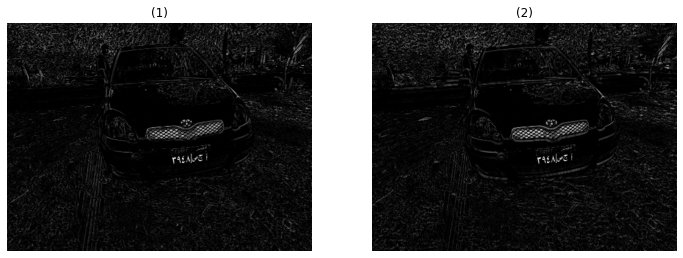

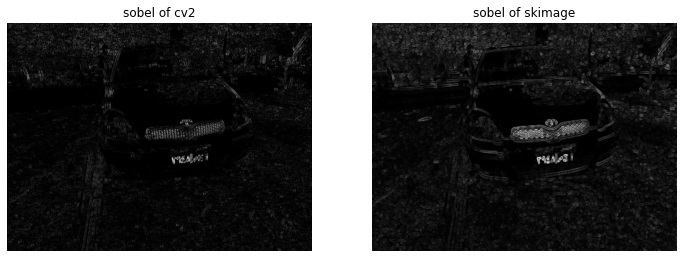

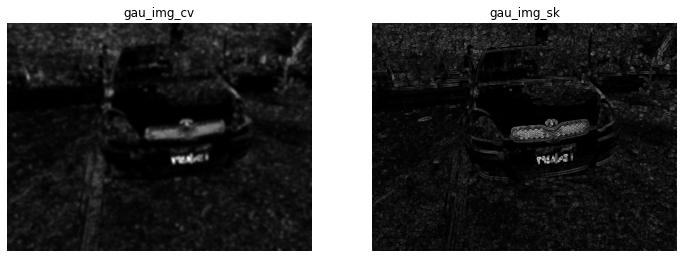

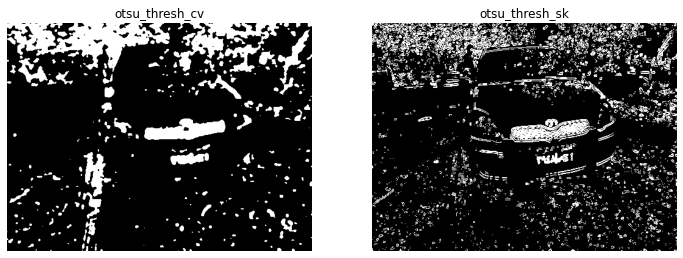

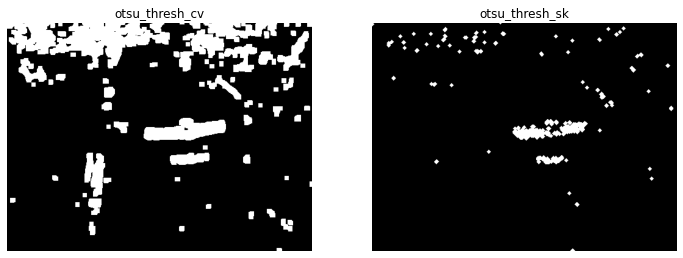

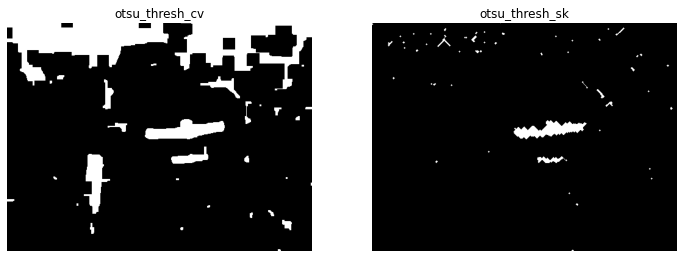

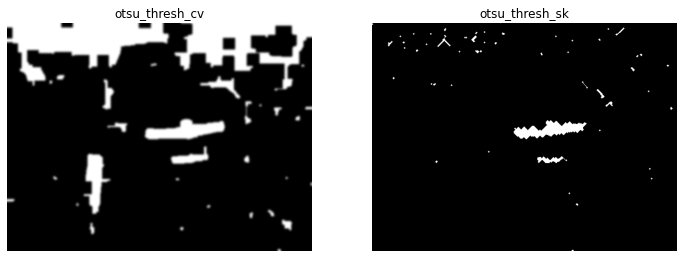

0.0 0.0 0.0


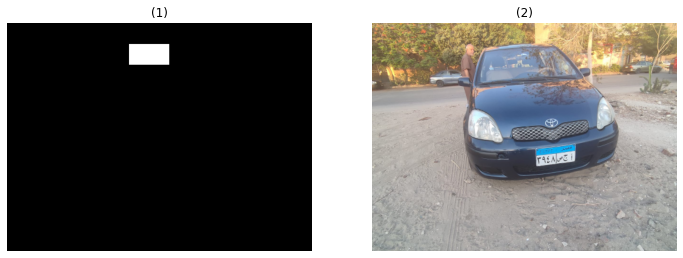

In [4]:
images = []
path = "./eC/"

# for root, _, files in os.walk(path):
#     current_directory_path = os.path.abspath(root)
#     for f in files:
#         name, ext = os.path.splitext(f)
#         current_image_path = os.path.join(current_directory_path, f)
#         current_image = mpimg.imread(current_image_path).astype(np.uint8)[:,:,:3]
#         images.append([current_image,name])

# for imgs in images:
img=io.imread("./eC/img8.jpg")
#img=imgs[0]
#show_images([imgs[0]],[imgs[1]])
show_images([img])
img=imutils.resize(img , width = 500)
###################################################
grayedimg=rgb2gray(img)

show_images([grayedimg])

#############################
img_after_orig_minus_closing=black_tophat(grayedimg,np.ones((5,3)))
blackhat=black_hat_cv2(grayedimg)
blackhat=img_as_ubyte(blackhat)
show_images([blackhat,img_after_orig_minus_closing])
####################################################
img1=binary_dilation(grayedimg,np.ones((3,3)))
img1=binary_erosion(img1,np.ones((3,3)))
img_thresh = img1
img_thresh[ img1 < 50 ] = 0
img_thresh[ img_thresh >= 50 ] = 255

light_regions=find_light_regions(grayedimg)
##################################################

sobelX_cv2 = sobel_x_cv2(blackhat)
sobelX_skimage=sobel(img_after_orig_minus_closing)
show_images([sobelX_cv2,sobelX_skimage],["sobel of cv2","sobel of skimage"])
###################################################

gau_img_sk = gaussian(sobelX_skimage, sigma=0, truncate=1/5)
gau_img_cv =gaussian_cv(sobelX_cv2)
show_images([gau_img_cv,gau_img_sk],["gau_img_cv","gau_img_sk"])
###################################################
otsu_thresh_cv=otsu_threshold(gau_img_cv)
thresh = threshold_otsu(gau_img_sk)
otsu_thresh_sk = gau_img_sk > thresh
show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
##################################################

otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 2)
otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 3)

otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])

##################################################
#otsu_thresh_cv = bitwise_and(otsu_thresh_cv,light_regions)
#otsu_thresh_sk = cv2.bitwise_and(otsu_thresh_sk, otsu_thresh_sk, mask = light_regions)
#show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
otsu_thresh_sk=binary_dilation(otsu_thresh_sk)

otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
otsu_thresh_sk=binary_erosion(otsu_thresh_sk)

otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 6)
otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 8)
show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
######################################################################################3

otsu_thresh_cv=gaussian_cv(otsu_thresh_cv)
otsu_thresh_sk=gau_img_sk = gaussian(otsu_thresh_sk, sigma=0, truncate=1/5)
show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])


##############################################################################
img_with_boxes= np.zeros(img.shape)
#contours = find_contours(otsu_thresh_cv, 0.8)
contours,_ = cv2.findContours(otsu_thresh_cv, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
bounding_boxes = []
#w,h
contour_list=[]
for contour in contours:
        #box = [min(contour[:, 1]), max(contour[:, 1]), min(contour[:, 0]), max(contour[:, 0])]
        #w=abs(box[0] - box[1])
        #h=abs(box[2] - box[3])
        #print(contour)
        x,y,w,h=cv2.boundingRect(contour)
        area=h*w
        ratio = w/h
        if(ratio >= 1.8 and ratio <= 4):   
            if(area>1000 and area<4000):
                    #[x1,x2,y1,y2]=box
                    #x1=int(x1)
                   # x2=int(x2)
                   # y1=int(y1)
                   # y2=int(y2)
                    bounding_boxes.append([x,y,w,h])

#print(bounding_boxes)                                        
cropped=img  
for box in bounding_boxes:
        #x,y,w,h = cv2.boundingRect(box)
        [Xmin, Xmax, Ymin, Ymax] = box

           # x,y,w,h = 
        Xmin=int(Xmin)
        Xmax=int(Xmax)
        Ymin=int(Ymin)
        Ymax=int(Ymax)
        h=int(h)
        w=int(w)
        #print(Xmin,Xmax,Ymin,Ymax)
        #print(h,w)
        #img_cropped = cv2.rectangle(img,(Xmin,Ymin),(Xmin+w,Ymin+h),(0,255,0),2)
        img_cropped=img[Ymin:Ymax,Xmin:Xmax]
        avg_red_ch = np.sum(img_cropped[:,:,0])/(w*h)  
        avg_green_ch = np.sum(img_cropped[:,:,1])/ (w*h)   
        avg_blue_ch = np.sum(img_cropped[:,:,2])/ (w*h) 
        # avg_red_ch >100 and avg_green_ch>100 and avg_blue_ch>80
        [B,G,R]=[np.sum(img_cropped[:,:,0]),np.sum(img_cropped[:,:,1]),np.sum(img_cropped[:,:,2])]
        #print(B,G,R)
        print(avg_red_ch,avg_green_ch,avg_blue_ch)
        #if(B<300000 and G<300000 and R<300000):
#         if(avg_red_ch>100 and avg_green_ch>100 and avg_blue_ch>80 and img_cropped.shape[0] and img_cropped.shape[1]):
        contour_list.append(img_cropped)

        #B = image[:,:,0]; G = image[:,:,1]; R = image[:,:,2]
        #cropped = image[x:x+w,y:y+h]
        rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=img.shape)
        img_with_boxes[rr.astype(int), cc.astype(int)] = 1 #set color white   
    #images[i]=img
    #i=i+1
show_images([img_with_boxes,cropped])


1
Ymin:  72 ,Ymax:  97
Ymin:  252 ,Ymax:  280
True
height 375
in loop 107
False
l: 72 Ymax: 0
l: 252 Ymax: 72
1
choosed plate index: 1


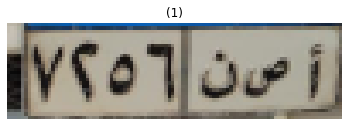

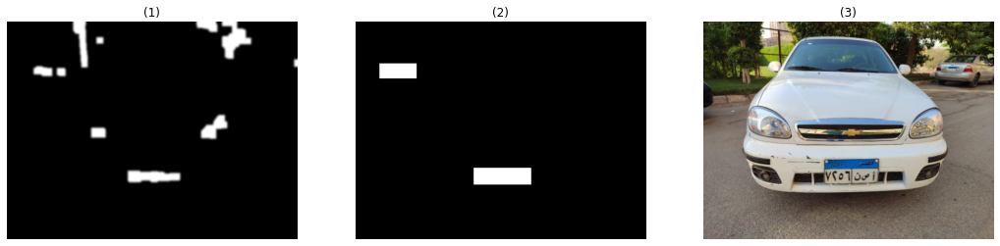

2
Ymin:  24 ,Ymax:  54
Ymin:  136 ,Ymax:  160
True
height 281
in loop 64
False
l: 24 Ymax: 0
l: 136 Ymax: 24
1
choosed plate index: 1


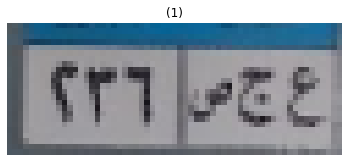

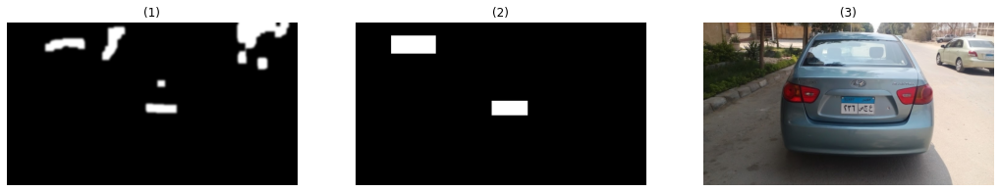

3
Ymin:  151 ,Ymax:  197
False
height 303
l: 151 Ymax: 0
0
choosed plate index: 0


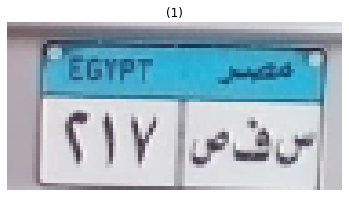

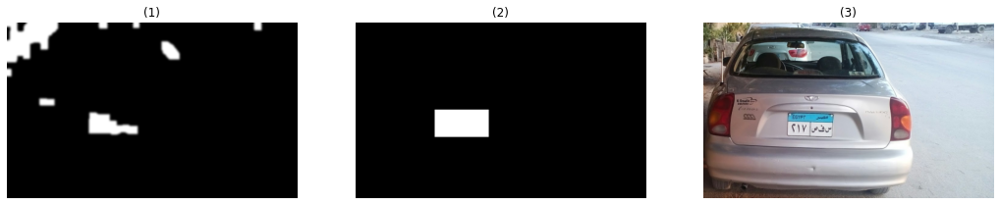

4
Ymin:  244 ,Ymax:  266
False
height 465
l: 244 Ymax: 0
0
choosed plate index: 0


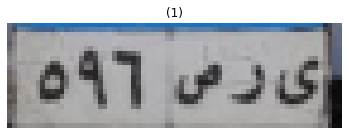

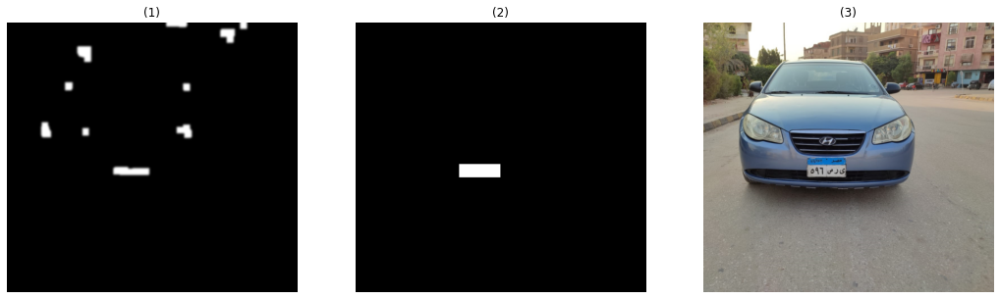

5
Ymin:  175 ,Ymax:  204
False
height 281
l: 175 Ymax: 0
0
choosed plate index: 0


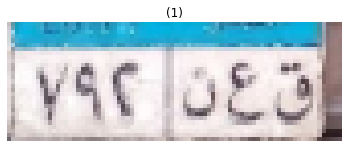

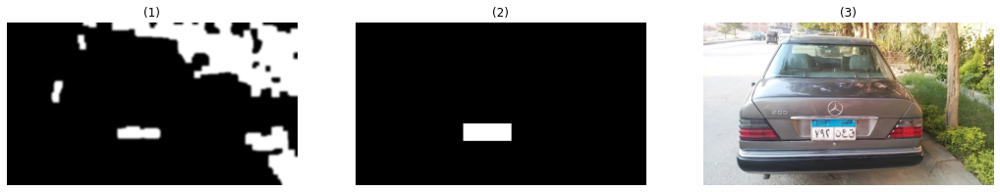

6
Ymin:  136 ,Ymax:  159
False
height 281
l: 136 Ymax: 0
0
choosed plate index: 0


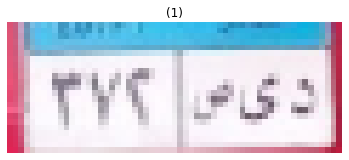

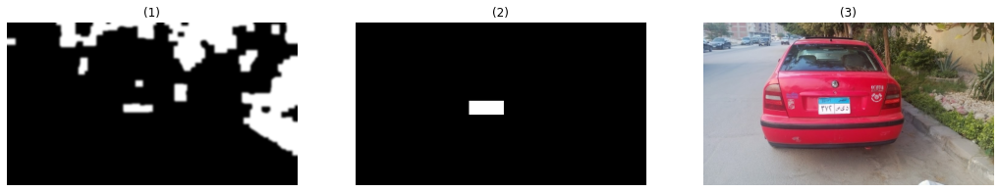

7
Ymin:  115 ,Ymax:  142
False
height 281
l: 115 Ymax: 0
0
choosed plate index: 0


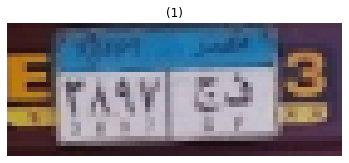

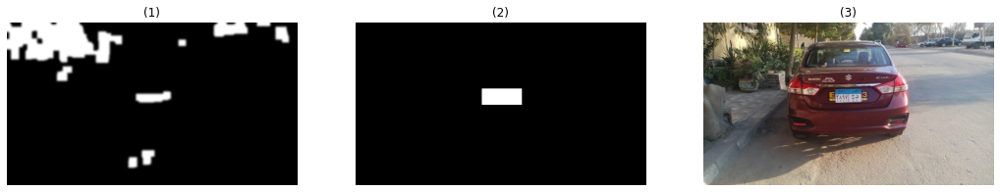

8
Ymin:  187 ,Ymax:  234
False
height 384
l: 187 Ymax: 0
0
choosed plate index: 0


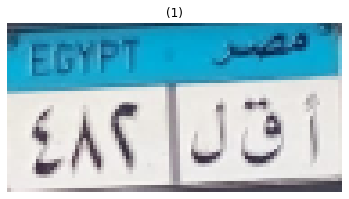

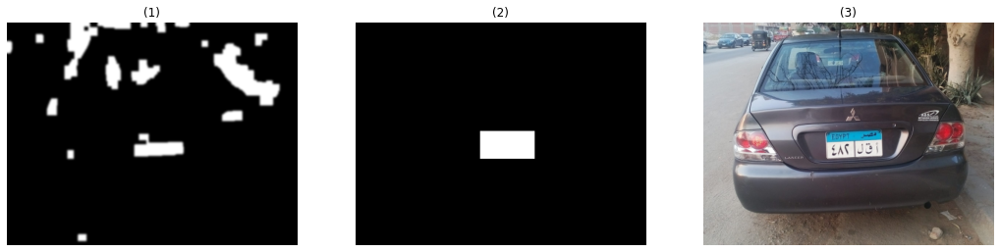

9
Ymin:  137 ,Ymax:  169
False
height 281
l: 137 Ymax: 0
0
choosed plate index: 0


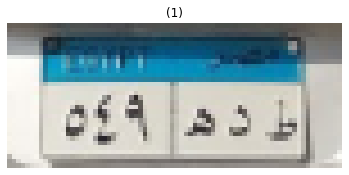

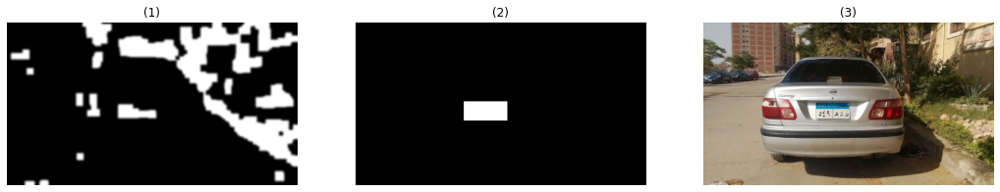

10
Ymin:  135 ,Ymax:  173
False
height 281
l: 135 Ymax: 0
0
choosed plate index: 0


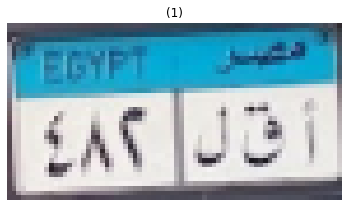

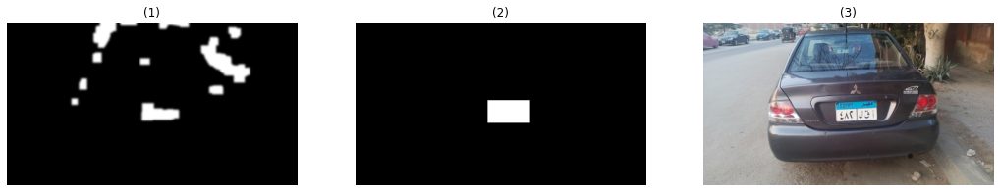

11
Ymin:  193 ,Ymax:  233
Ymin:  277 ,Ymax:  307
True
height 374
in loop 243
False
l: 193 Ymax: 0
l: 277 Ymax: 193
1
choosed plate index: 1


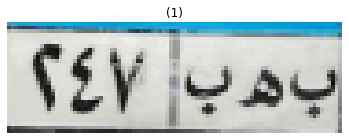

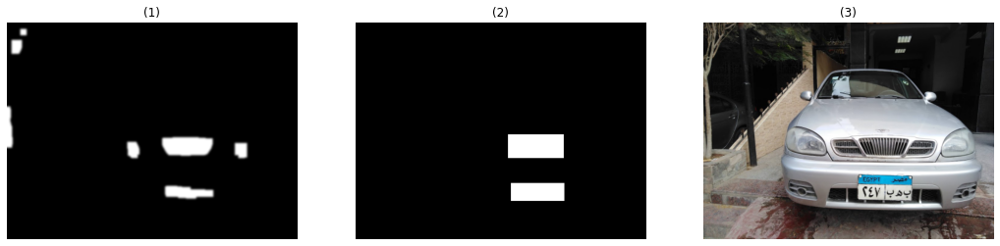

12
Ymin:  78 ,Ymax:  125
Ymin:  224 ,Ymax:  271
True
height 539
in loop 135
False
l: 78 Ymax: 0
l: 224 Ymax: 78
1
choosed plate index: 1


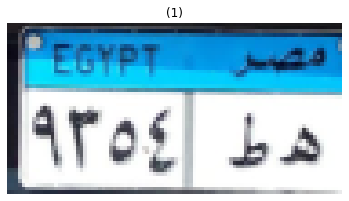

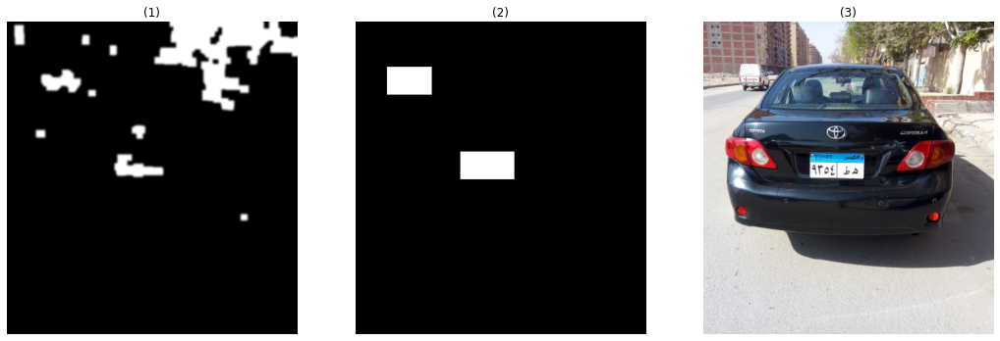

13
Ymin:  218 ,Ymax:  258
False
height 374
l: 218 Ymax: 0
0
choosed plate index: 0


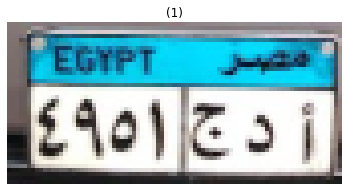

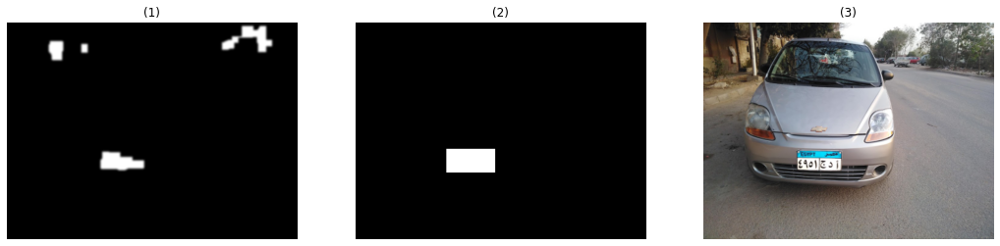

14
Ymin:  173 ,Ymax:  216
False
height 374
l: 173 Ymax: 0
0
choosed plate index: 0


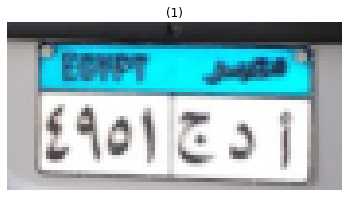

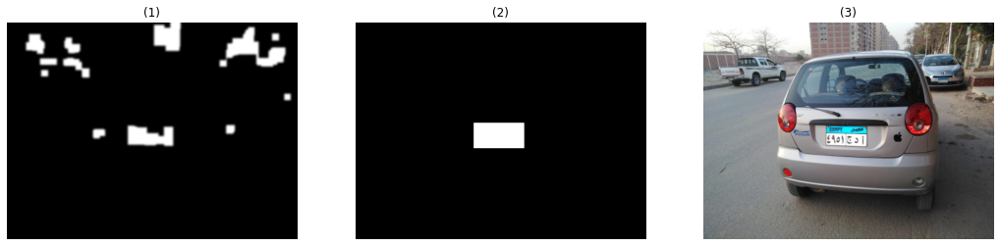

15
Ymin:  157 ,Ymax:  194
False
height 374
l: 157 Ymax: 0
0
choosed plate index: 0


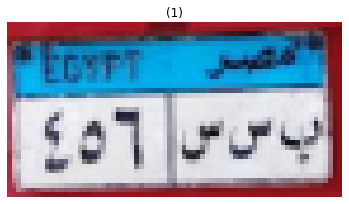

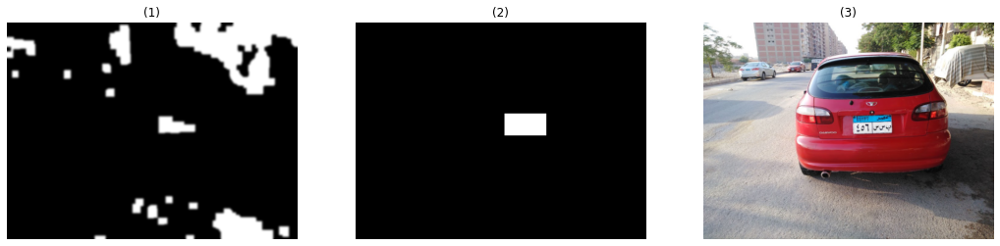

16
Ymin:  125 ,Ymax:  149
False
height 233
l: 125 Ymax: 0
0
choosed plate index: 0


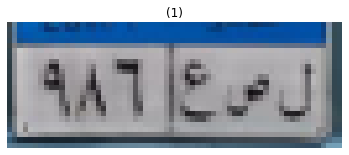

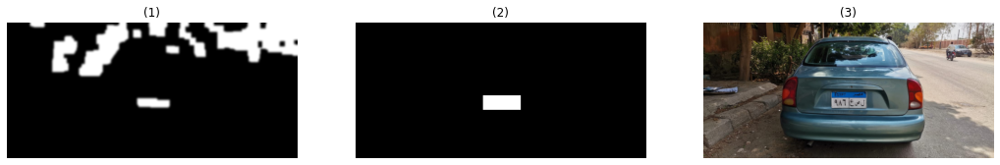

17
Ymin:  172 ,Ymax:  204
Ymin:  217 ,Ymax:  250
True
height 374
in loop 214
False
l: 172 Ymax: 0
l: 217 Ymax: 172
1
choosed plate index: 1


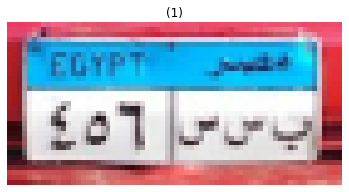

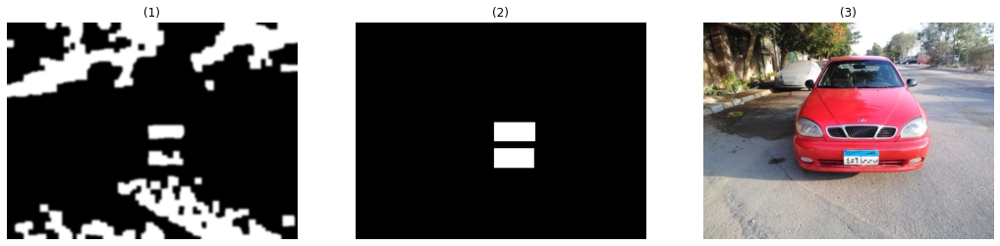

18
Ymin:  177 ,Ymax:  219
Ymin:  234 ,Ymax:  258
True
height 374
in loop 229
False
l: 177 Ymax: 0
l: 234 Ymax: 177
1
choosed plate index: 1


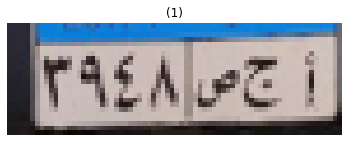

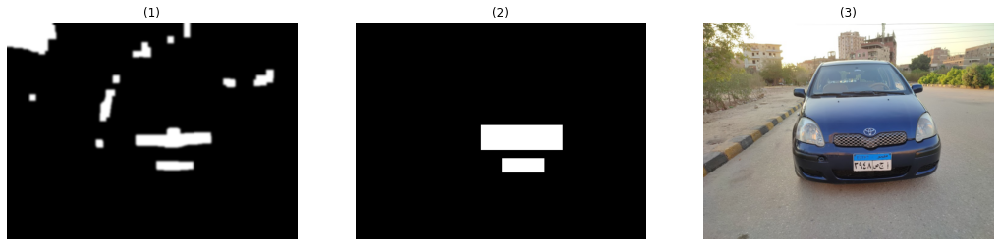

19
Ymin:  372 ,Ymax:  408
False
height 666
l: 372 Ymax: 0
0
choosed plate index: 0


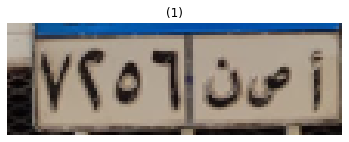

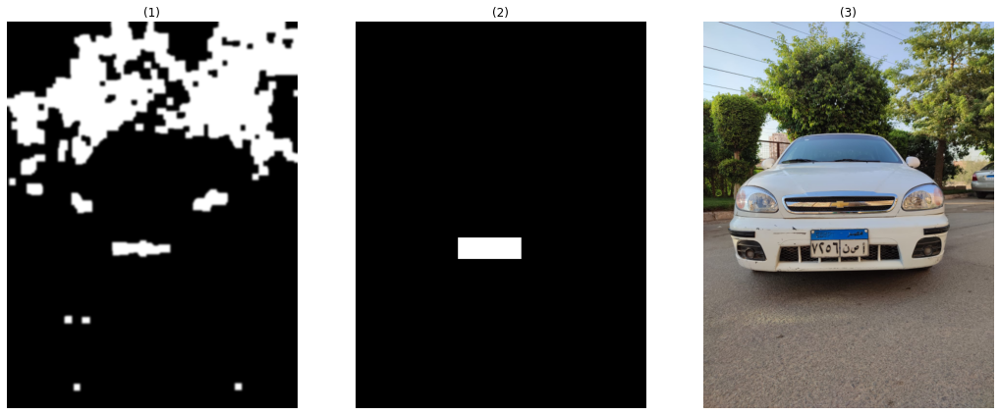

20
Ymin:  174 ,Ymax:  219
Ymin:  244 ,Ymax:  277
True
height 374
in loop 229
False
l: 174 Ymax: 0
l: 244 Ymax: 174
1
choosed plate index: 1


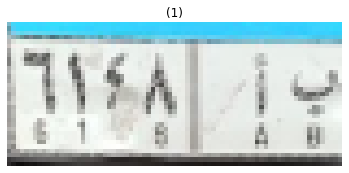

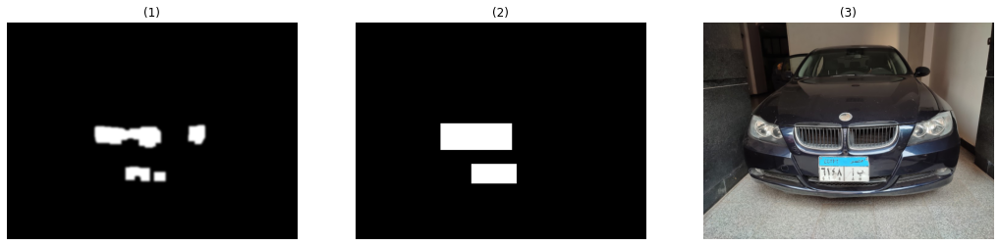

21
Ymin:  290 ,Ymax:  316
False
height 375
l: 290 Ymax: 0
0
choosed plate index: 0


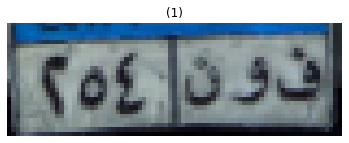

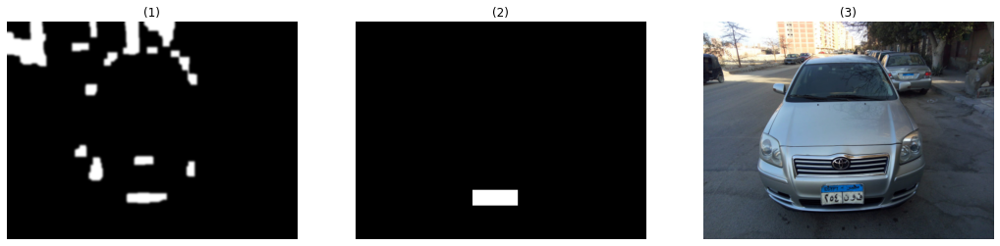

22
Ymin:  270 ,Ymax:  302
False
height 375
l: 270 Ymax: 0
0
choosed plate index: 0


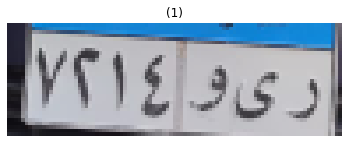

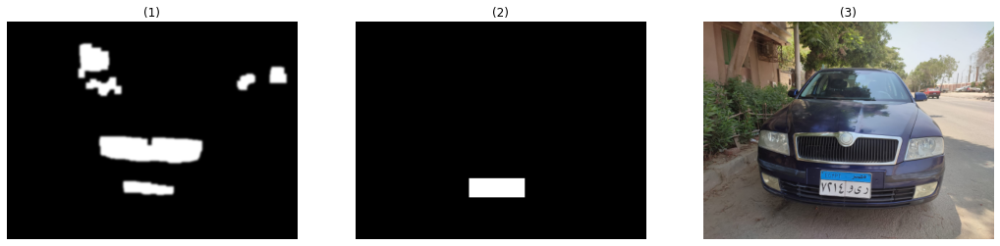

23
Ymin:  212 ,Ymax:  243
False
height 375
l: 212 Ymax: 0
0
choosed plate index: 0


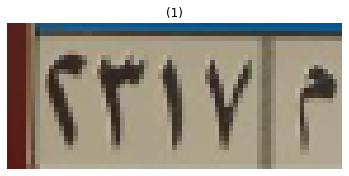

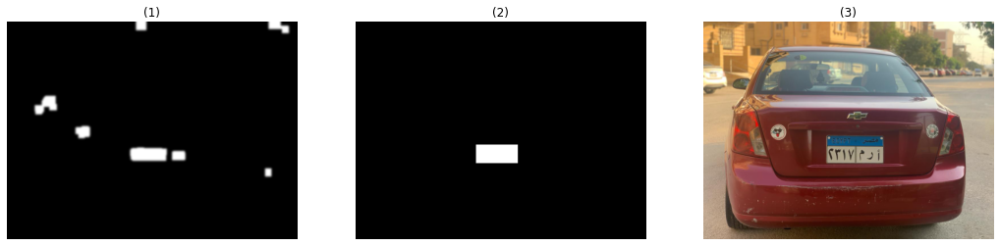

24
Ymin:  225 ,Ymax:  257
False
height 374
l: 225 Ymax: 0
0
choosed plate index: 0


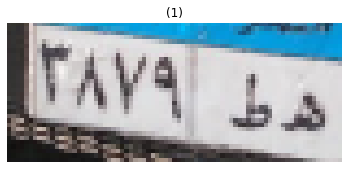

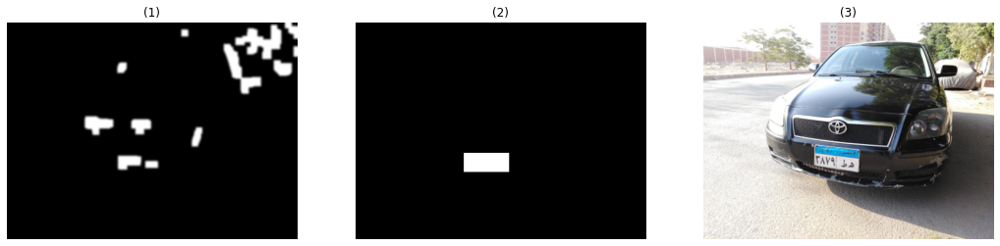

25
Ymin:  233 ,Ymax:  263
False
height 375
l: 233 Ymax: 0
0
choosed plate index: 0


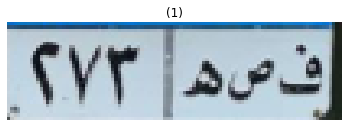

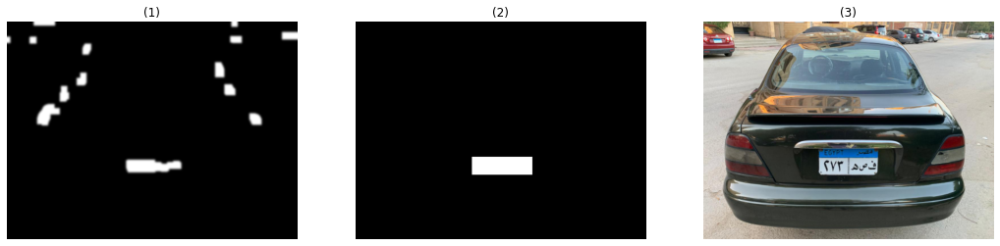

26
Ymin:  160 ,Ymax:  188
False
height 281
l: 160 Ymax: 0
0
choosed plate index: 0


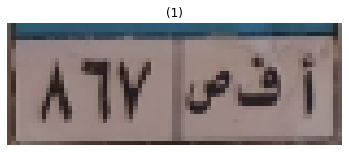

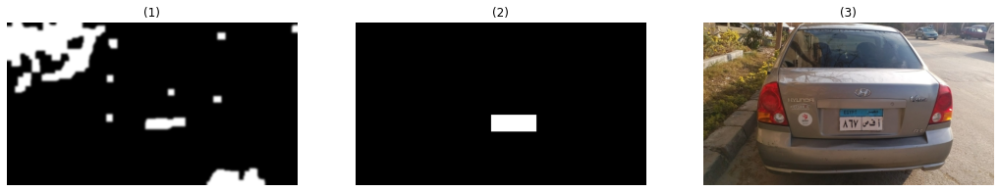

27
Ymin:  281 ,Ymax:  324
False
height 375
l: 281 Ymax: 0
0
choosed plate index: 0


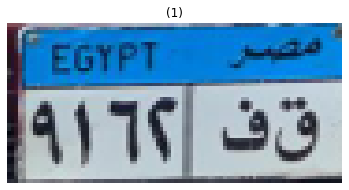

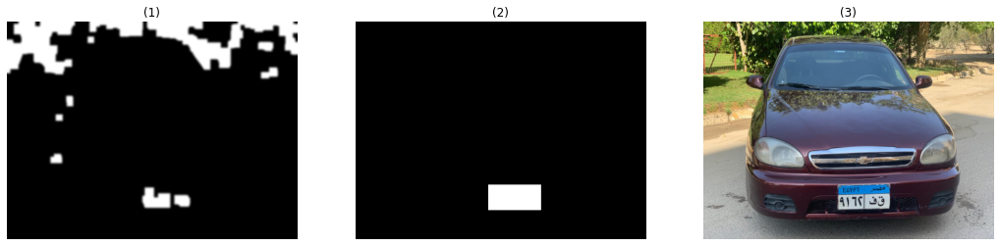

28
Ymin:  273 ,Ymax:  316
False
height 375
l: 273 Ymax: 0
0
choosed plate index: 0


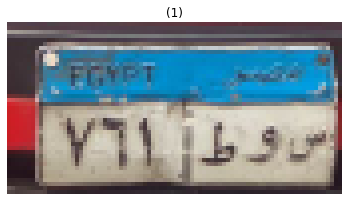

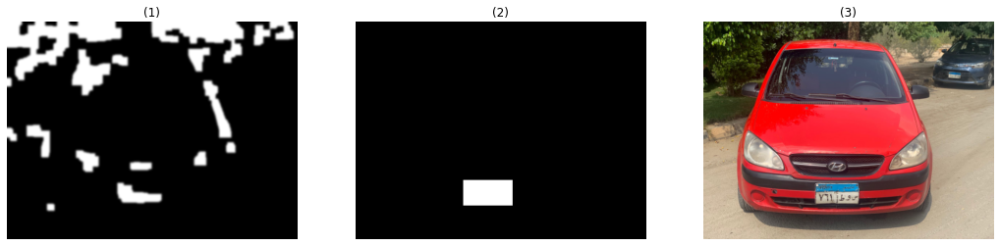

29
Ymin:  294 ,Ymax:  321
False
height 375
l: 294 Ymax: 0
0
choosed plate index: 0


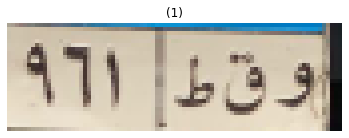

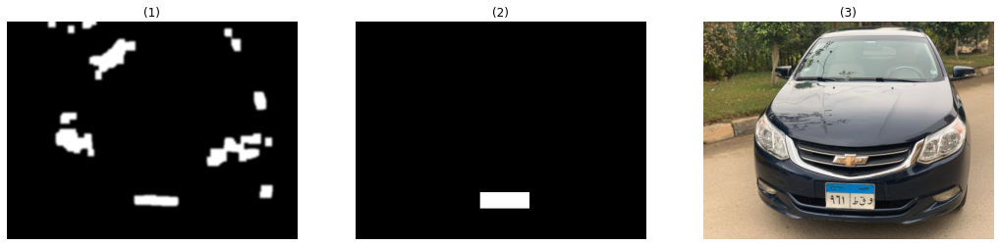

30
Ymin:  312 ,Ymax:  341
False
height 375
l: 312 Ymax: 0
0
choosed plate index: 0


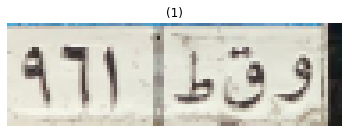

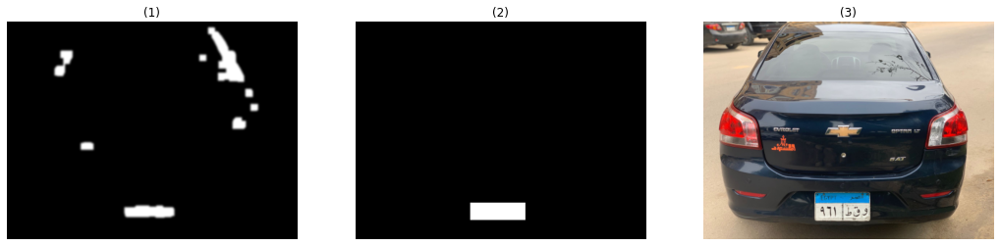

31
Ymin:  290 ,Ymax:  329
False
height 375
l: 290 Ymax: 0
0
choosed plate index: 0


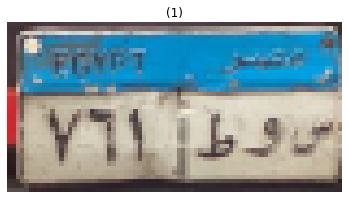

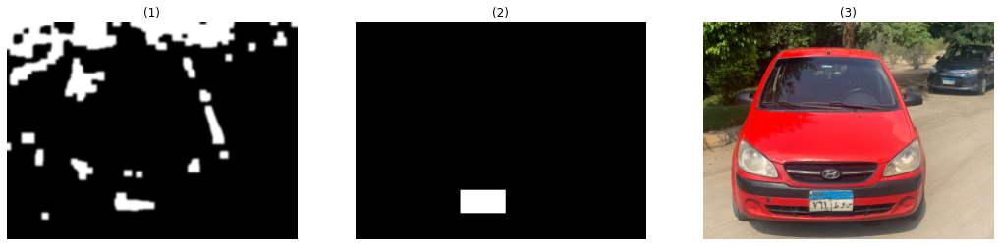

32
Ymin:  295 ,Ymax:  326
False
height 375
l: 295 Ymax: 0
0
choosed plate index: 0


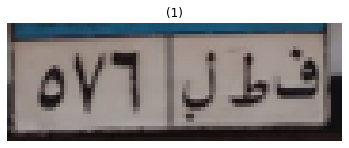

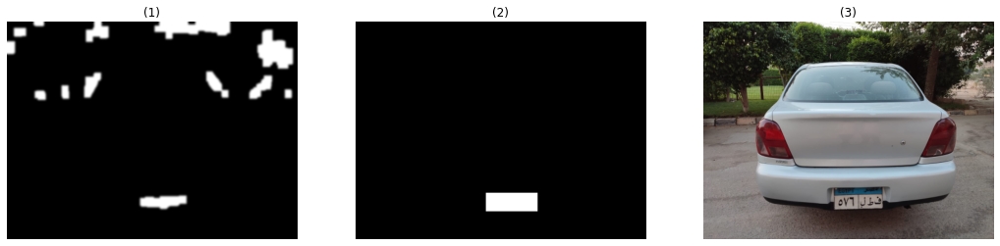

33
Ymin:  93 ,Ymax:  124
Ymin:  275 ,Ymax:  305
True
height 375
in loop 134
False
l: 93 Ymax: 0
l: 275 Ymax: 93
1
choosed plate index: 1


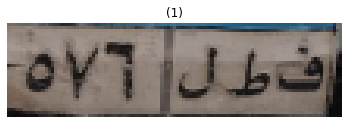

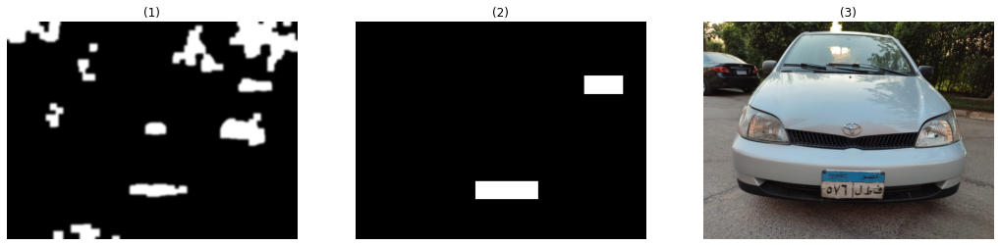

34
Ymin:  257 ,Ymax:  287
Ymin:  332 ,Ymax:  361
True
height 492
in loop 297
False
l: 257 Ymax: 0
l: 332 Ymax: 257
1
choosed plate index: 1


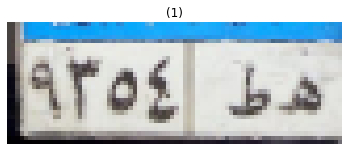

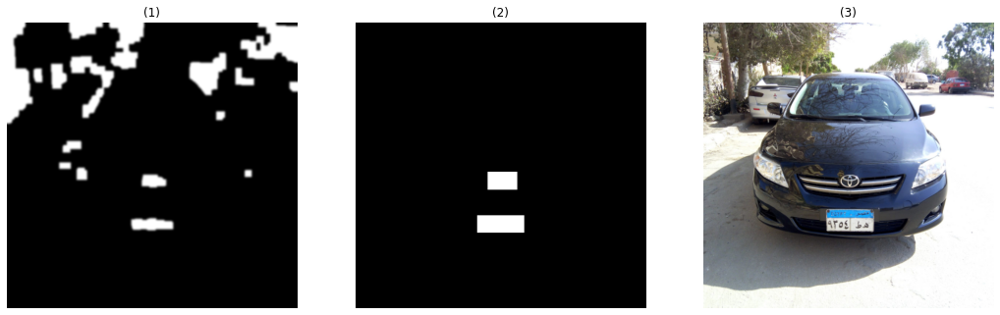

35
Ymin:  312 ,Ymax:  341
False
height 375
l: 312 Ymax: 0
0
choosed plate index: 0


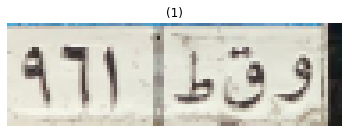

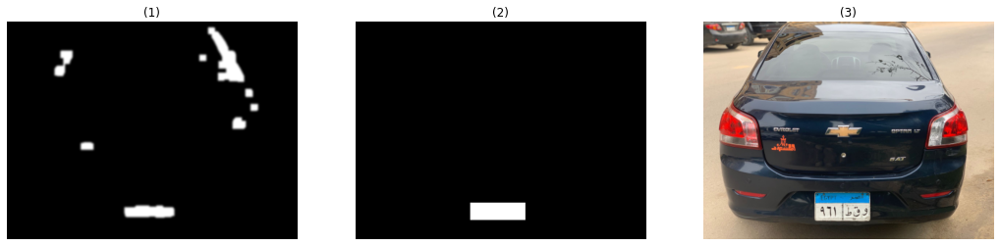

36
Ymin:  274 ,Ymax:  315
False
height 375
l: 274 Ymax: 0
0
choosed plate index: 0


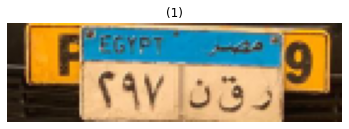

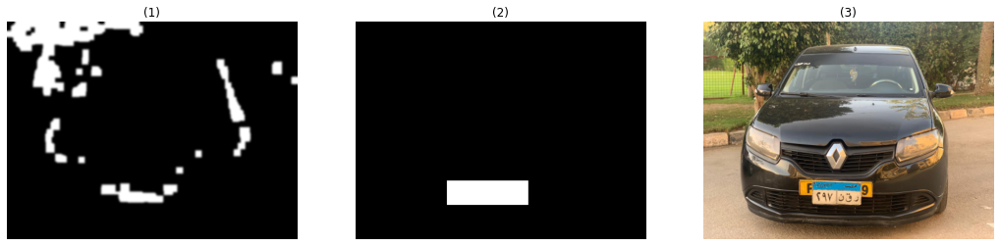

37
Ymin:  312 ,Ymax:  343
False
height 375
l: 312 Ymax: 0
0
choosed plate index: 0


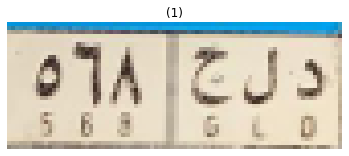

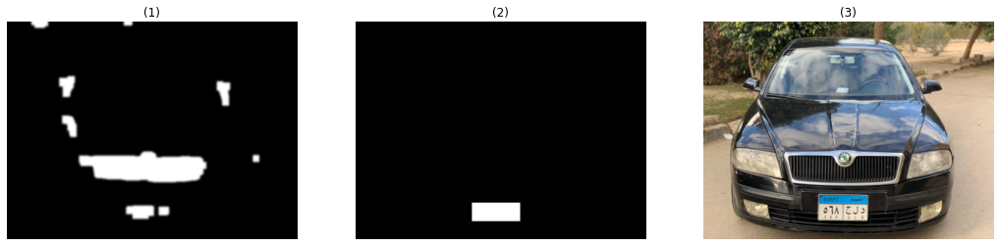

38
Ymin:  367 ,Ymax:  415
False
height 666
l: 367 Ymax: 0
0
choosed plate index: 0


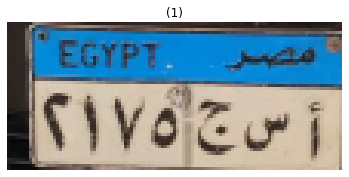

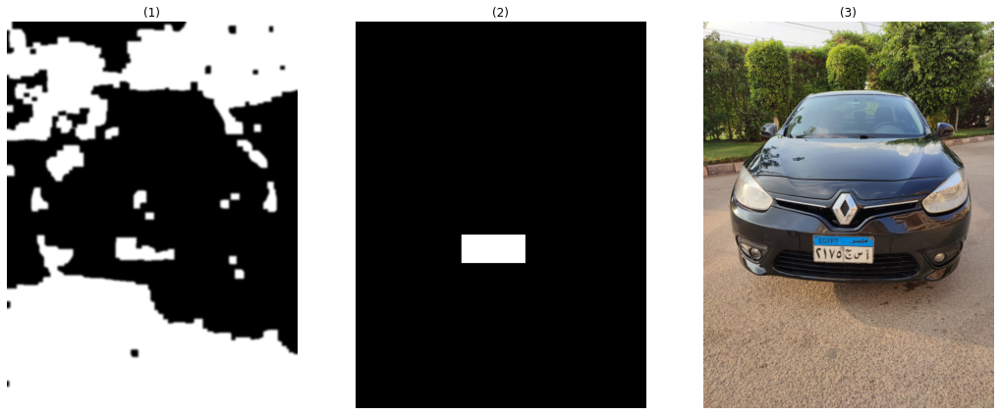

39
Ymin:  164 ,Ymax:  199
Ymin:  206 ,Ymax:  243
True
height 375
in loop 209
False
l: 164 Ymax: 0
l: 206 Ymax: 164
1
choosed plate index: 1


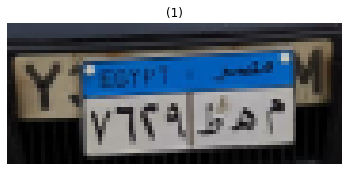

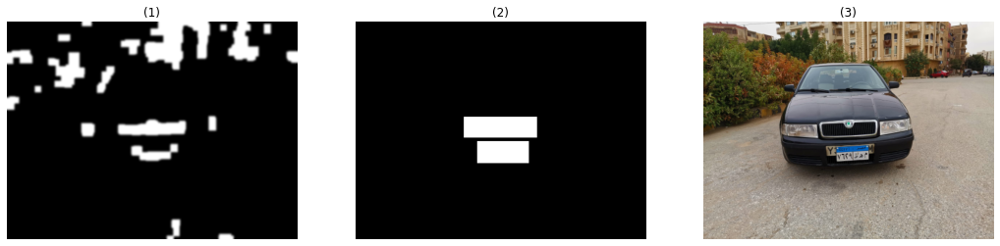

40
Ymin:  232 ,Ymax:  273
False
height 375
l: 232 Ymax: 0
0
choosed plate index: 0


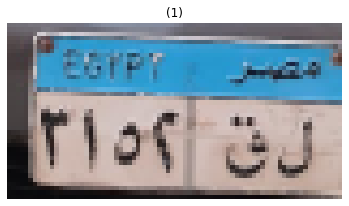

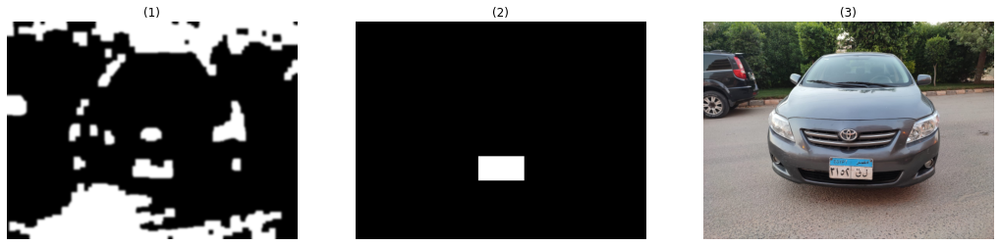

41
Ymin:  282 ,Ymax:  315
False
height 374
l: 282 Ymax: 0
0
choosed plate index: 0


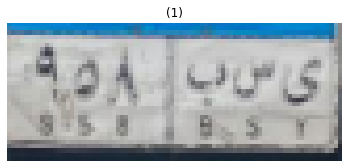

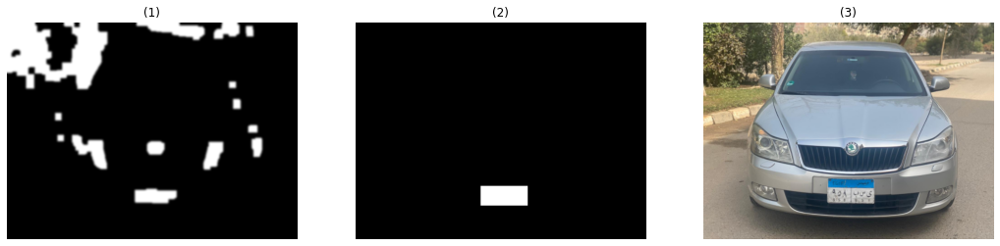

42
Ymin:  26 ,Ymax:  69
Ymin:  179 ,Ymax:  204
True
height 375
in loop 79
False
l: 26 Ymax: 0
l: 179 Ymax: 26
1
choosed plate index: 1


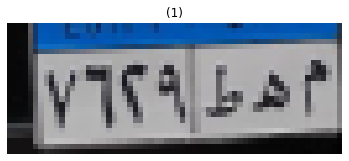

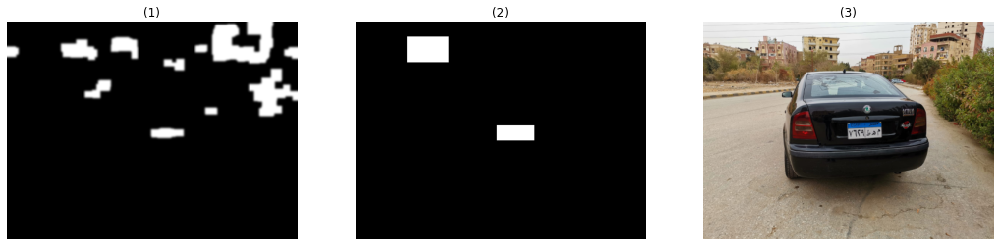

43
Ymin:  60 ,Ymax:  96
Ymin:  184 ,Ymax:  225
True
height 375
in loop 106
False
l: 60 Ymax: 0
l: 184 Ymax: 60
1
choosed plate index: 1


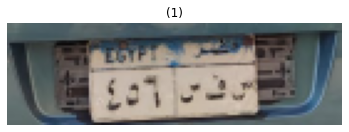

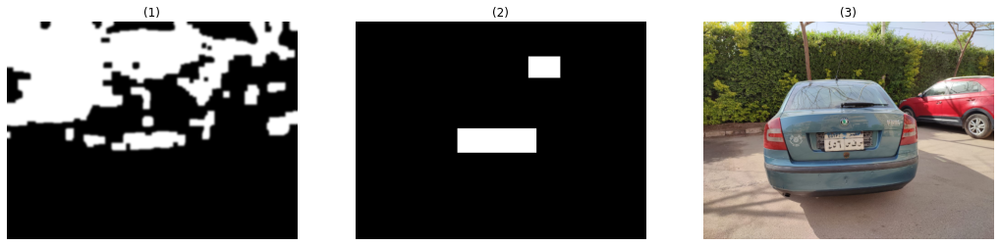

44
Ymin:  249 ,Ymax:  288
False
height 375
l: 249 Ymax: 0
0
choosed plate index: 0


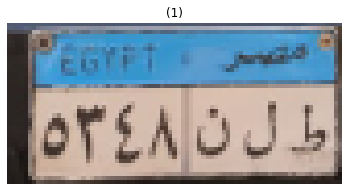

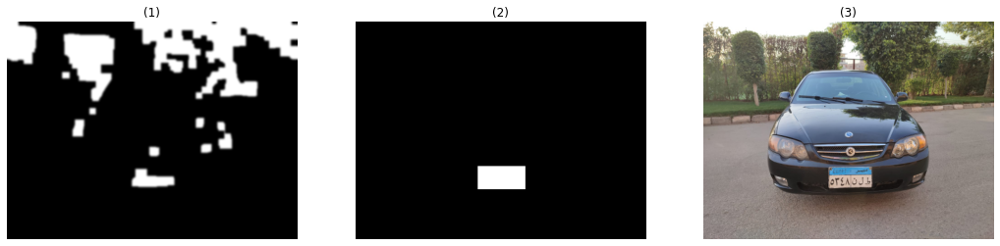

45
Ymin:  192 ,Ymax:  240
False
height 375
l: 192 Ymax: 0
0
choosed plate index: 0


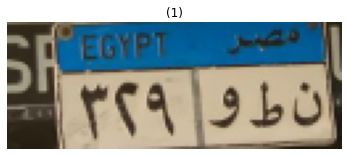

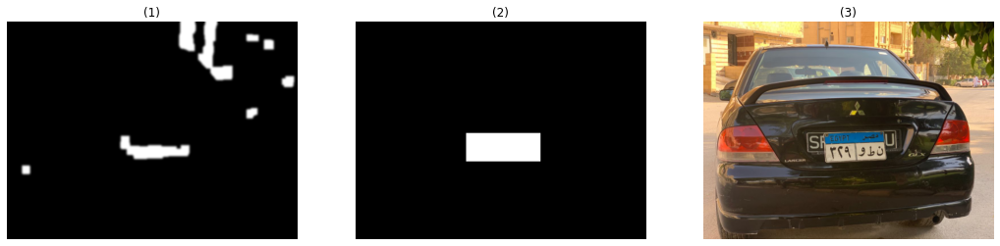

46
Ymin:  408 ,Ymax:  457
False
height 666
l: 408 Ymax: 0
0
choosed plate index: 0


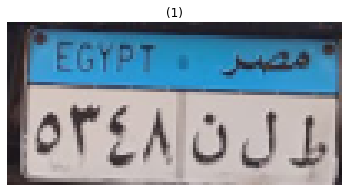

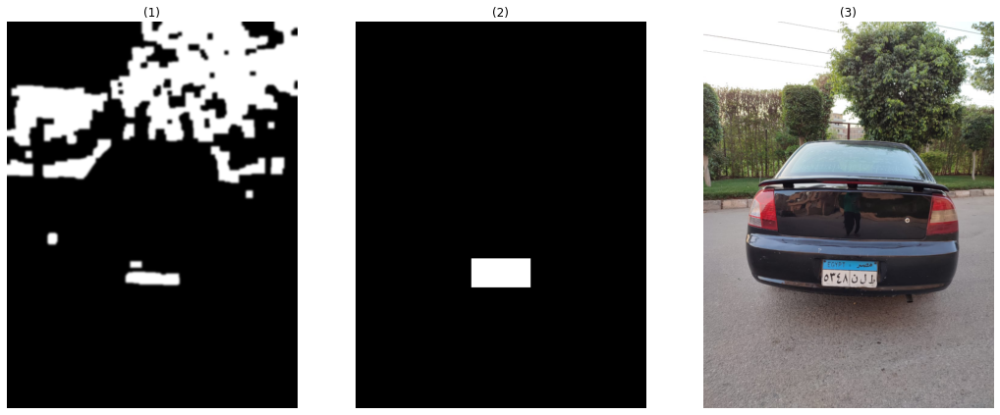

47
Ymin:  335 ,Ymax:  376
False
height 483
l: 335 Ymax: 0
0
choosed plate index: 0


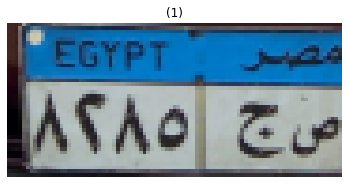

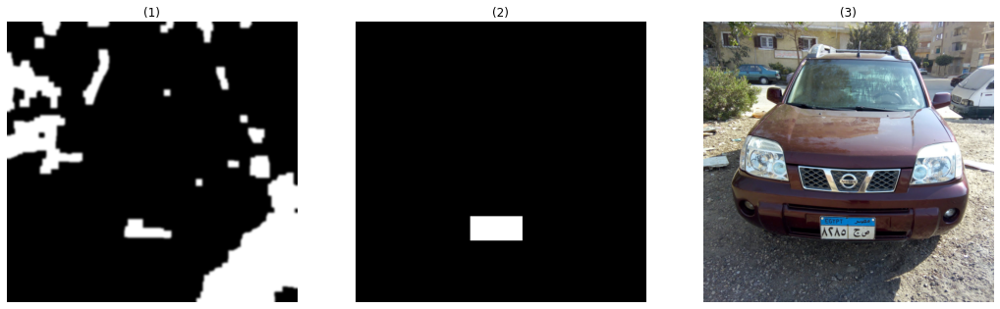

48
Ymin:  174 ,Ymax:  223
False
height 375
l: 174 Ymax: 0
0
choosed plate index: 0


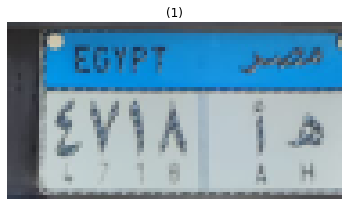

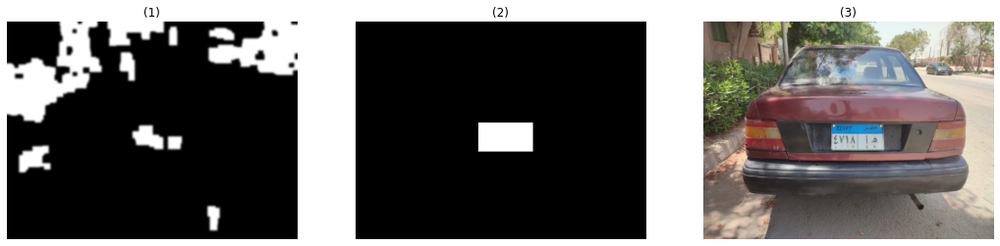

49
Ymin:  174 ,Ymax:  223
False
height 375
l: 174 Ymax: 0
0
choosed plate index: 0


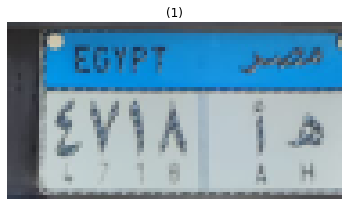

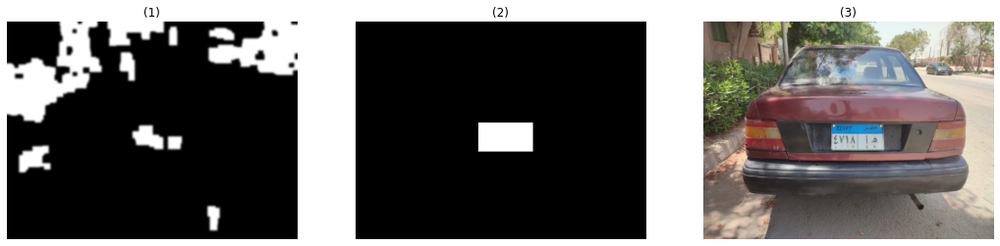

50
Ymin:  226 ,Ymax:  264
False
height 375
l: 226 Ymax: 0
0
choosed plate index: 0


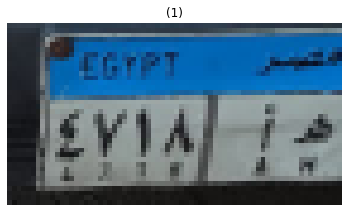

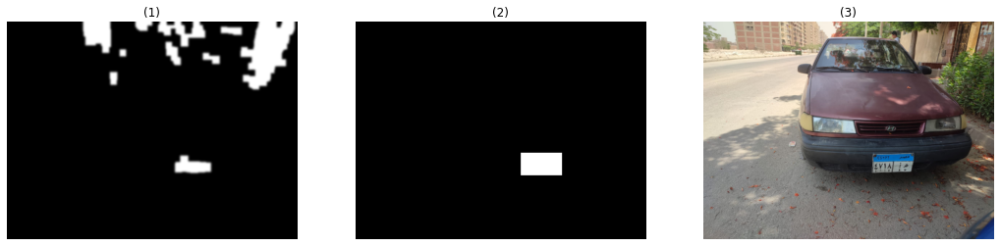

51
Ymin:  148 ,Ymax:  192
False
height 375
l: 148 Ymax: 0
0
choosed plate index: 0


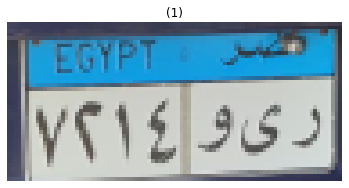

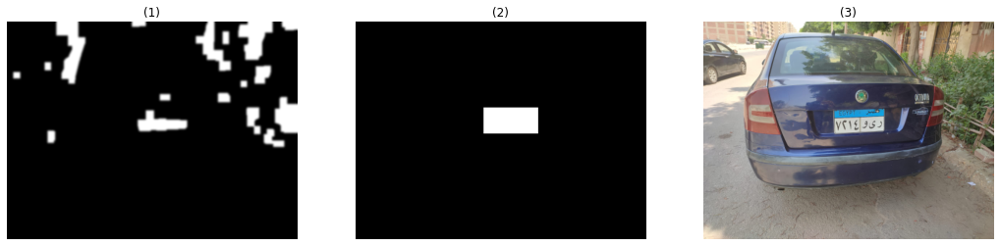

52
Ymin:  19 ,Ymax:  56
Ymin:  28 ,Ymax:  51
Ymin:  70 ,Ymax:  106
Ymin:  181 ,Ymax:  218
False
height 375
l: 19 Ymax: 0
l: 28 Ymax: 19
l: 70 Ymax: 28
l: 181 Ymax: 70
3
choosed plate index: 3


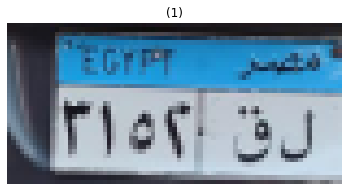

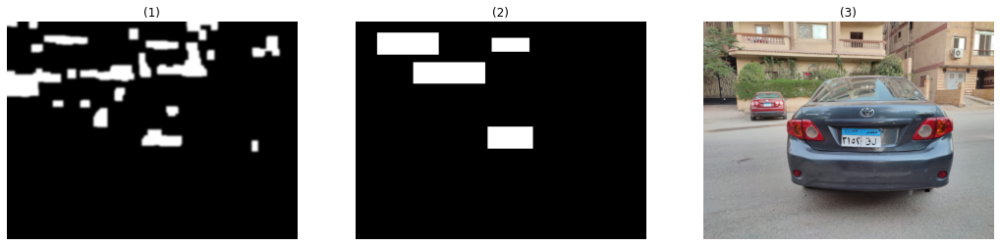

53
Ymin:  409 ,Ymax:  456
False
height 666
l: 409 Ymax: 0
0
choosed plate index: 0


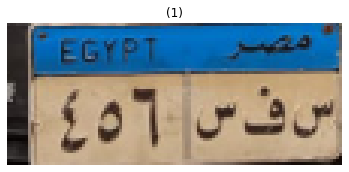

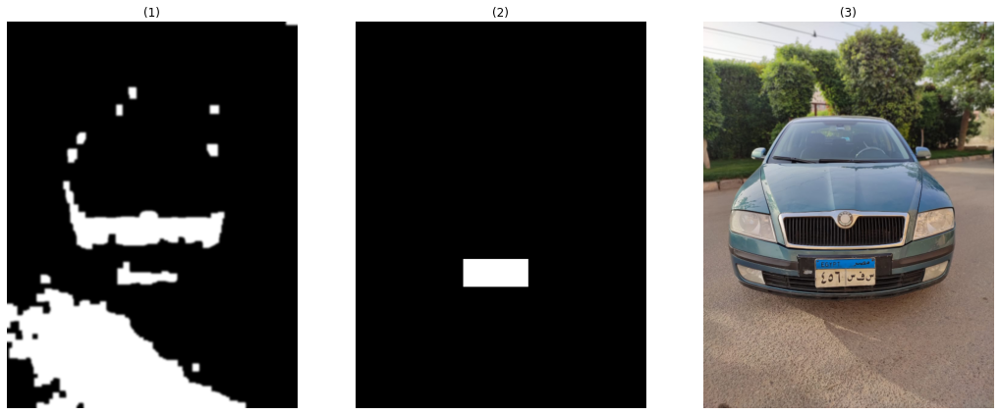

54
Ymin:  216 ,Ymax:  241
False
height 374
l: 216 Ymax: 0
0
choosed plate index: 0


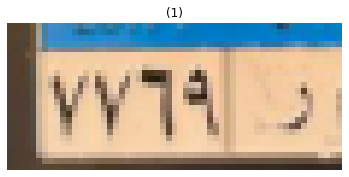

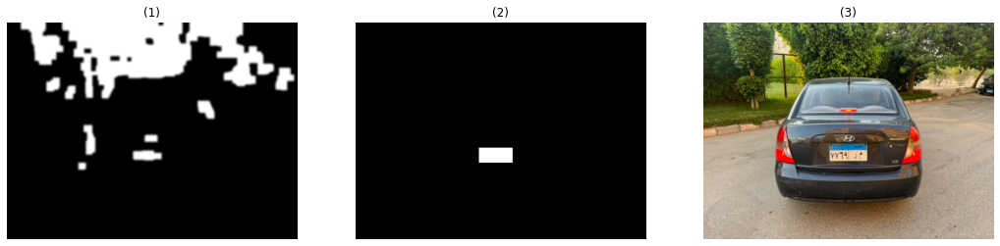

55
Ymin:  200 ,Ymax:  226
False
height 374
l: 200 Ymax: 0
0
choosed plate index: 0


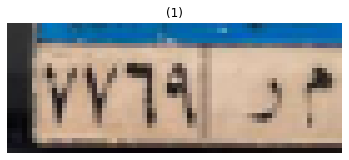

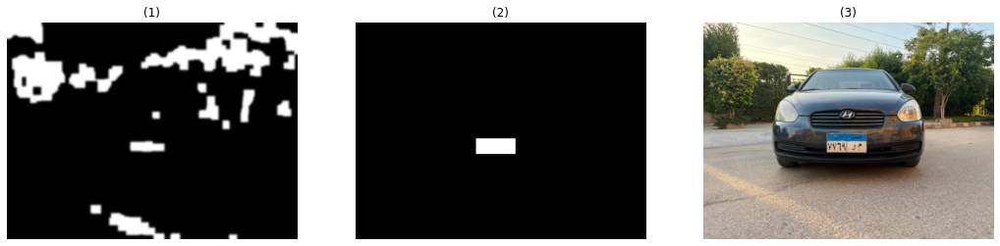

56
Ymin:  276 ,Ymax:  300
False
height 375
l: 276 Ymax: 0
0
choosed plate index: 0


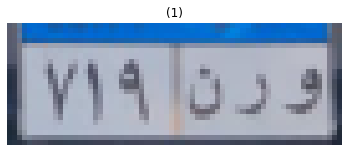

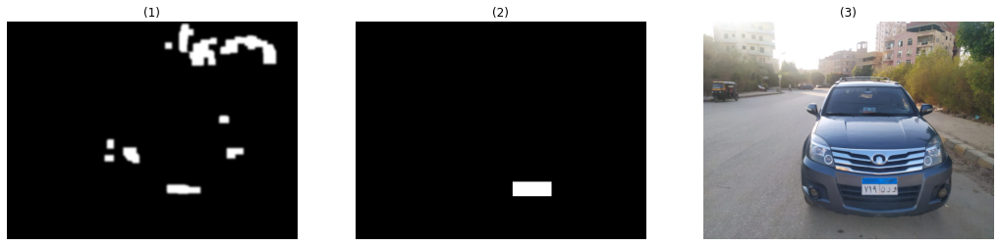

57
Ymin:  218 ,Ymax:  244
False
height 374
l: 218 Ymax: 0
0
choosed plate index: 0


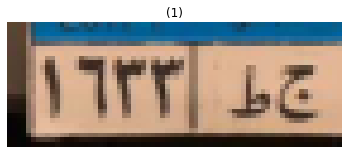

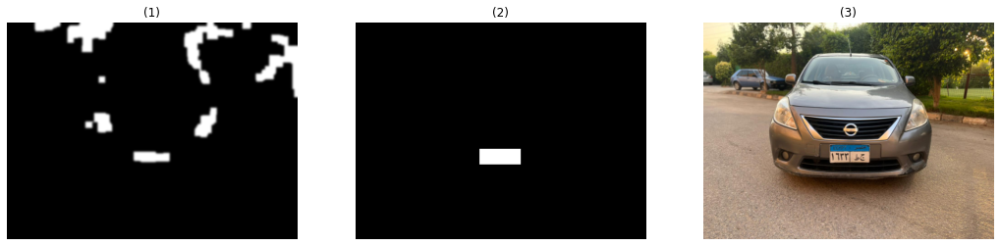

58
Ymin:  203 ,Ymax:  228
False
height 374
l: 203 Ymax: 0
0
choosed plate index: 0


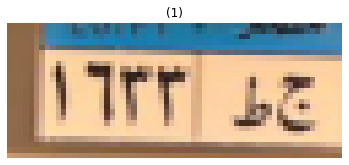

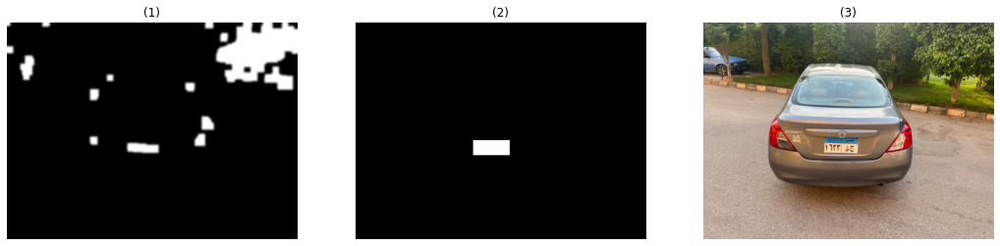

59
Ymin:  322 ,Ymax:  356
False
height 666
l: 322 Ymax: 0
0
choosed plate index: 0


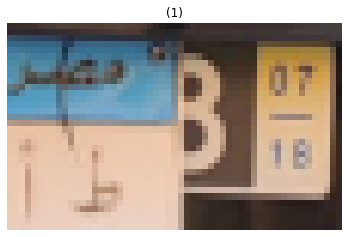

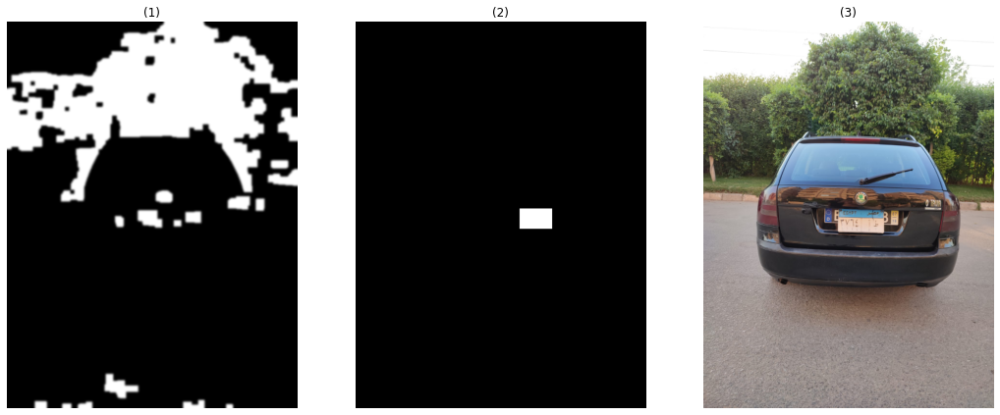

60
Ymin:  310 ,Ymax:  336
False
height 374
l: 310 Ymax: 0
0
choosed plate index: 0


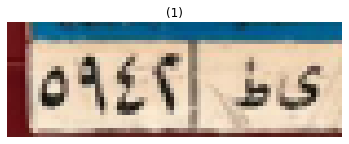

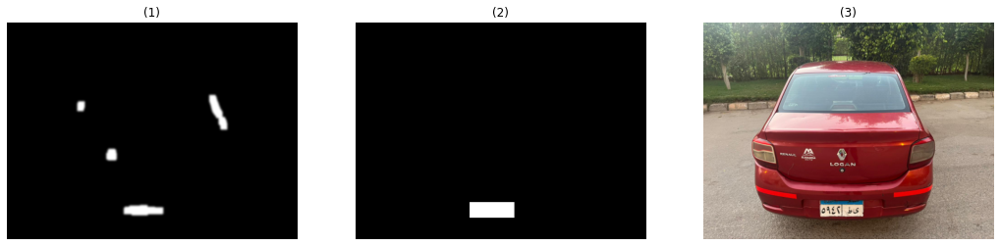

61
Ymin:  204 ,Ymax:  232
False
height 375
l: 204 Ymax: 0
0
choosed plate index: 0


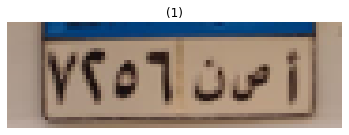

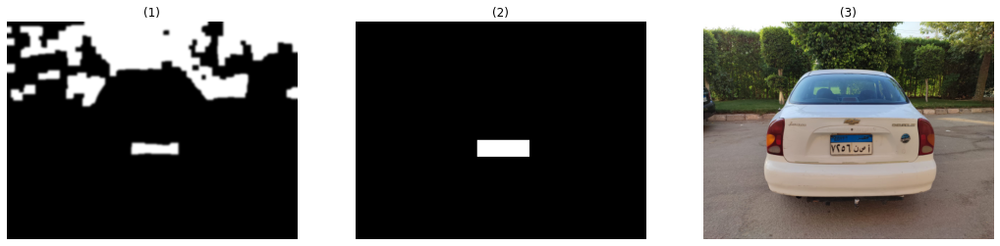

62
Ymin:  152 ,Ymax:  197
Ymin:  210 ,Ymax:  237
True
height 375
in loop 207
False
l: 152 Ymax: 0
l: 210 Ymax: 152
1
choosed plate index: 1


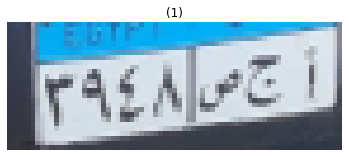

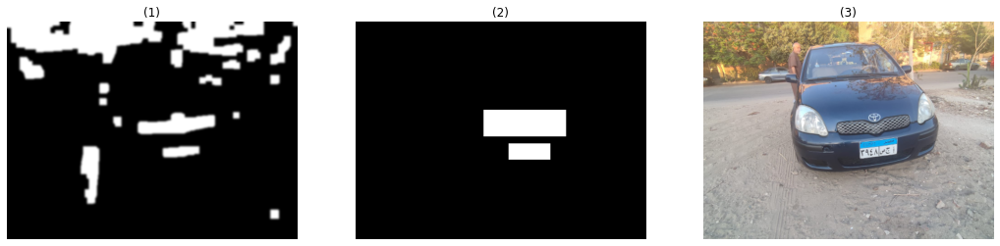

63
Ymin:  151 ,Ymax:  177
False
height 281
l: 151 Ymax: 0
0
choosed plate index: 0


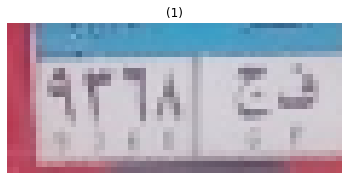

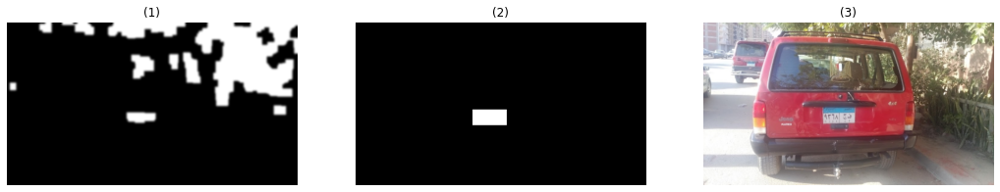

In [5]:
images = []
path = "./eC/"

for root, _, files in os.walk(path):
    current_directory_path = os.path.abspath(root)
    for f in files:
        name, ext = os.path.splitext(f)
        current_image_path = os.path.join(current_directory_path, f)
        current_image = mpimg.imread(current_image_path).astype(np.uint8)[:,:,:3]
        images.append(current_image)


i=1        
for img in images:
    
#img=io.imread("./eC/img5.jpg")
    #show_images([img])
    print(i)
    i=i+1

    img=imutils.resize(img , width = 500)
    ###################################################
    grayedimg=rgb2gray(img)

    #show_images([grayedimg])

    #############################
    img_after_orig_minus_closing=grayedimg-binary_erosion(binary_dilation(grayedimg))
    img_after_orig_minus_closing=black_tophat(grayedimg,np.ones((5,3)))
    blackhat=black_hat_cv2(grayedimg)
    blackhat=img_as_ubyte(blackhat)
    #show_images([blackhat,img_after_orig_minus_closing])
    ####################################################
    img1=binary_dilation(grayedimg,np.ones((3,3)))
    img1=binary_erosion(img1,np.ones((3,3)))
    img_thresh = img1
    img_thresh[ img1 < 50 ] = 0
    img_thresh[ img_thresh >= 50 ] = 255

    light_regions=find_light_regions(grayedimg)
    ##################################################

    sobelX_cv2 = sobel_x_cv2(blackhat)
    sobelX_skimage=sobel(img_after_orig_minus_closing)
    #show_images([sobelX_cv2,sobelX_skimage],["sobel of cv2","sobel of skimage"])
    ###################################################

    gau_img_sk = gaussian(sobelX_skimage, sigma=0, truncate=1/5)
    gau_img_cv =gaussian_cv(sobelX_cv2)
    #show_images([gau_img_cv,gau_img_sk],["gau_img_cv","gau_img_sk"])
    ###################################################
    otsu_thresh_cv=otsu_threshold(gau_img_cv)
    thresh = threshold_otsu(gau_img_sk)
    otsu_thresh_sk = gau_img_sk > thresh
    #show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
    ##################################################

    otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 2)
    otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 3)

    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    #show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])

    ##################################################
    #otsu_thresh_cv = bitwise_and(otsu_thresh_cv,light_regions)
    #otsu_thresh_sk = cv2.bitwise_and(otsu_thresh_sk, otsu_thresh_sk, mask = light_regions)
    #show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)
    otsu_thresh_sk=binary_dilation(otsu_thresh_sk)

    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)
    otsu_thresh_sk=binary_erosion(otsu_thresh_sk)

    otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 3)
    otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 6)
    otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 8)
    otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 3)

    otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 3)
    otsu_thresh_cv = cv2.dilate(otsu_thresh_cv, None, iterations = 8)
    otsu_thresh_cv=cv2.erode(otsu_thresh_cv, None, iterations = 3)
#show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])
    ######################################################################################3

    otsu_thresh_cv=gaussian_cv(otsu_thresh_cv)
    otsu_thresh_sk=gau_img_sk = gaussian(otsu_thresh_sk, sigma=0, truncate=1/5)
    #show_images([otsu_thresh_cv],["otsu_thresh_cv"])
    #show_images([otsu_thresh_cv,otsu_thresh_sk],["otsu_thresh_cv","otsu_thresh_sk"])


    ##############################################################################
    img_with_boxes= np.zeros(img.shape)
    contours = find_contours(otsu_thresh_cv, 0.8)
    bounding_boxes = []
    #w,h
    for contour in contours:
            box = [min(contour[:, 1]), max(contour[:, 1]), min(contour[:, 0]), max(contour[:, 0])]
            w=abs(box[0] - box[1])
            h=abs(box[2] - box[3])
            area=h*w
            ratio = w/h
            if(ratio >= 1.5 and ratio <= 3.8):   
                if(w<150 and w>50 and h<50 and h>10 and box[2]-10>0 and box[3]+10<img.shape[0]):
                #if(area>1000 and area<4000):
                     bounding_boxes.append(box)    
    cropped=img     
    plate_list=[]
    for box in bounding_boxes:
            [Xmin, Xmax, Ymin, Ymax] = box
            Xmin=int(Xmin)
            Xmax=int(Xmax)
            Ymin=int(Ymin)
            Ymax=int(Ymax)
            print("Ymin: ",Ymin,",Ymax: ",Ymax)
            h=int(h)
            w=int(w)
            img_cropped=img[Ymin:Ymax,Xmin:Xmax]

            #hist =np.sum( cv2.calcHist([img_cropped],[0,1,2],None,[256],[0,256]))
            
            
            #print(hist)
           
        # avg_red_ch >100 and avg_green_ch>100 and avg_blue_ch>80
            [B,G,R]=[np.sum(img_cropped[:,:,0]),np.sum(img_cropped[:,:,1]),np.sum(img_cropped[:,:,2])]
        #print(B,G,R)
            plate_list.append([img_cropped,Ymin,Ymax])
            #x,y,w,h = cv2.boundingRect(box)

            #cropped = image[x:x+w,y:y+h]
            rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=img.shape)
            img_with_boxes[rr.astype(int), cc.astype(int)] = 1 #set color white   
        #images[i]=img
        #i=i+1
    choosed_plate_index=-1;
    Yhigh=0
    print(len(plate_list)==2)
    print("height",img.shape[0])
    x=0;
    if(len(plate_list)==2):
        print("in loop",plate_list[0][2]+10)
        print((plate_list[0][2]+10)>img.shape[0])
        if((plate_list[0][2]+10)>img.shape[0]):
            choosed_plate_index=1;
        elif((plate_list[1][2]+10)>img.shape[0]):
            choosed_plate_index=0;
        else:
            for z, plate_instance in enumerate(plate_list):
                print("l:",plate_instance[1],"Ymax:",Yhigh)

                if(plate_instance[1]>Yhigh):
                    Yhigh=plate_instance[1]
                    choosed_plate_index=x
                x=x+1   
    else:
         for z, plate_instance in enumerate(plate_list):
                print("l:",plate_instance[1],"Ymax:",Yhigh)

                if(plate_instance[1]>Yhigh):
                    Yhigh=plate_instance[1]
                    choosed_plate_index=x
                x=x+1 
    plate_final=[]     
    print(choosed_plate_index)            

    if(choosed_plate_index!=-1):
        print("choosed plate index:",choosed_plate_index)
        plate_final.append(plate_list[choosed_plate_index][0])
    else:
        for plate_instance in plate_list:
            plate_final.append(plate_instance[0])
    show_images(plate_final)    
    show_images([otsu_thresh_cv,img_with_boxes,cropped])
